In [1]:
import torch
from torch import nn
from torch.utils.data import DataLoader

import numpy as np 
import pathlib

# Importing utitility functions for training
from PT_files.model import DnCNN, DnCNN_B
from PT_files.Dataset import Img_Dataset, Large_Img_Dataset
import PT_files.preprocess_data as ppd
import PT_files.save_load as sl
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
# device = "cpu"

Using cuda device


In [2]:
data_6k = sl.NERSC_load('test_data70-6000.npy')
# model = DnCNN()
# param_name = "2k_model_bs64_e200.pth"    
# start_idx = 0
# end_idx = 2000

# samp_idx = 0
# noise_data_2k = data_6k[0]

Function that uses 2k by 2k slices

In [5]:
def grid_window(dataset,
                model,
                model_params,
                samp_idx,
                h_start,
                h_end,
                w_start,
                w_end):
    
    full = np.empty((1, 1, 6000, 6000))
    count = np.empty((1, 1, 6000, 6000))
    
    noise_data = dataset[0]
    params_name = model_params
    
    current_dir = pathlib.Path().resolve()
    model_params_path = current_dir / 'Model_params'
    assert model_params_path.exists()
    model_path = model_params_path / params_name
    
    model = model()
    model.to(device)
    model.load_state_dict(torch.load(str(model_path)))
    model.eval()
    
    with torch.no_grad():
        
        torch.cuda.empty_cache()
        test_noise = torch.as_tensor(noise_data[samp_idx:samp_idx+1, :, h_start:h_end, w_start:w_end])
        test_noise = test_noise.to(device)
        
        output = model(test_noise)
        resid_img = output.cpu().detach().numpy()
        
        full[:, :, h_start:h_end, w_start:w_end] += resid_img
        count[:, :, h_start:h_end, w_start:w_end] += 1
        
    return full, count

In [6]:
full, count = grid_window(dataset=data_6k,
                          model=DnCNN,
                          model_params="2k_model_bs64_e200.pth",
                          samp_idx=0,
                          h_start=0,
                          h_end=2000,
                          w_start=0,
                          w_end=2000)

Text(0.5, 1.0, 'Truth Sample')

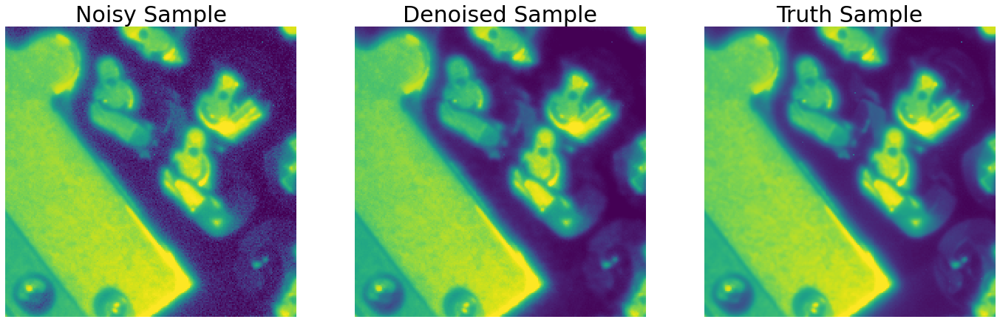

In [7]:
fig, ax = plt.subplots(1, 3, figsize=(24,20))
vmin, vmax = np.percentile(data_6k[0][0][0][1200:1400,1000:1200], (1,99))


ax[0].imshow(data_6k[0][0][0][1200:1400,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[0].axis('off')
ax[0].set_title('Noisy Sample', fontsize=30)
ax[1].imshow(full[0][0][1200:1400,1000:1200],vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[1].axis('off')
ax[1].set_title('Denoised Sample', fontsize=30)
ax[2].imshow(data_6k[1][0][0][1200:1400,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[2].axis('off')
ax[2].set_title('Truth Sample', fontsize=30)

In [3]:
def grid_window(dataset,
                model,
                model_params,
                samp_idx,
                h_start,
                h_end, 
                w_start,
                w_end):
    
    full = np.empty((1, 1, 6000, 6000))
    count = np.empty((1, 1, 6000, 6000))
    
    noise_data = dataset[0]
    param_name = str(model_params)
    
    current_dir = pathlib.Path().resolve()
    model_params_path = current_dir / 'Model_params'
    assert model_params_path.exists()
    model_path = model_params_path / param_name

    model = model()
    model.to(device)
    model.load_state_dict(torch.load(str(model_path)))
    model.eval();
    
    with torch.no_grad():
        
        test_noise = torch.as_tensor(noise_data[samp_idx:samp_idx+1, :, h_start:h_end, w_start:w_end])
        test_noise = test_noise.to(device)
        
        output = model(test_noise)
        resid_img = output.to('cpu').detach().numpy()
        
        full[:, :, h_start:h_end, w_start:w_end] += resid_img
        count[:, :, h_start:h_end, w_start:w_end] += 1
        
        return full, count

In [4]:
full, count = grid_window(dataset=data_6k,
                             model=DnCNN,
                             model_params="2k_model_bs64_e200.pth",
                             samp_idx=0,
                             h_start=0,
                             h_end=2000,
                             w_start=0,
                             w_end=0)

RuntimeError: Calculated padded input size per channel: (2002 x 2). Kernel size: (3 x 3). Kernel size can't be greater than actual input size

In [5]:
def full_grid_pass_window(dataset,
                   model,
                   samp_idx,
                   w_start,
                   w_end,
                   h_start,
                   h_end):
    
    full = np.empty((1, 1, 6000,6000))
    count = np.empty((1, 1, 6000,6000))
    
    noise_data = dataset[0]
    param_name = "2k_model_bs64_e200.pth"
    
    current_dir = pathlib.Path().resolve()
    model_params_path = current_dir / 'Model_params'
    assert model_params_path.exists()
    model_path = model_params_path / param_name
    
    model = model()
    model.to(device)
    model.load_state_dict(torch.load(str(model_path)))
    model.eval();
    # telling pytorch this is for inference and not learning, so keeps the weights unchanged
    with torch.no_grad():
        
        torch.cuda.empty_cache()
        test_noise = torch.as_tensor(noise_data[samp_idx:samp_idx+1,:, w_start:w_end, h_start:h_end])
        test_noise = test_noise.to(device)

        output = model(test_noise)
        resid_img = output.to('cpu').detach().numpy()
        
        full[:, :, w_start: w_end, h_start: h_end] += resid_img
        count[:, :, w_start: w_end, h_start: h_end] += 1
        
    return full, count

In [6]:
full, count = full_grid_pass_window(dataset=data_6k,
                             model= DnCNN,
                             samp_idx=0,
                             h_start=0,
                             h_end=2000,
                             w_start=0,
                             w_end=0)

RuntimeError: Calculated padded input size per channel: (2 x 2002). Kernel size: (3 x 3). Kernel size can't be greater than actual input size

In [7]:
def full_grid_pass_window(dataset,
                   model,
                   samp_idx,
                   w_start,
                   w_end,
                   h_start,
                   h_end):
    
    full = np.empty((1, 1, 6000,6000))
    count = np.empty((1, 1, 6000,6000))
    
    noise_data = dataset[0]
    param_name = "2k_model_bs64_e200.pth"
    
    current_dir = pathlib.Path().resolve()
    model_params_path = current_dir / 'Model_params'
    assert model_params_path.exists()
    model_path = model_params_path / param_name
    
    model = model()
    model.to(device)
    model.load_state_dict(torch.load(str(model_path)))
    model.eval();
    # telling pytorch this is for inference and not learning, so keeps the weights unchanged
    with torch.no_grad():
        
        torch.cuda.empty_cache()
        test_noise = torch.as_tensor(noise_data[samp_idx:samp_idx+1,:, w_start:w_end, h_start:h_end])
        test_noise = test_noise.to(device)

        output = model(test_noise)
        resid_img = output.to('cpu').detach().numpy()
        
        full[:, :, w_start: w_end, h_start: h_end] += resid_img
        count[:, :, w_start: w_end, h_start: h_end] += 1
        
    return full, count

In [8]:
full, count = full_grid_pass_window(dataset=data_6k,
                             model= DnCNN,
                             samp_idx=0,
                             w_start=0,
                             w_end=2000,
                             h_start=0,
                             h_end=2000)

In [5]:
def full_grid_pass(dataset,
                   model,
                   samp_idx
                   ):
    
    slice_list = [2000, 4000, 6000]
    
    for i in range(len(slice_list)):
        for j in range(len(slice_list)):
            full, count = full_grid_pass_window(dataset=data_6k,
                                     model= DnCNN,
                                     samp_idx=0,
                                     w_start=0,
                                     w_end=slice_list[j],
                                     h_start=0,
                                     h_end=slice_list[i])
            
    return full,count

CUDA out of memory. I can see why because I'm trying to run inference on 9 separate images

In [6]:
full, count = full_grid_pass(dataset=data_6k,
                             model= DnCNN,
                             samp_idx=0)

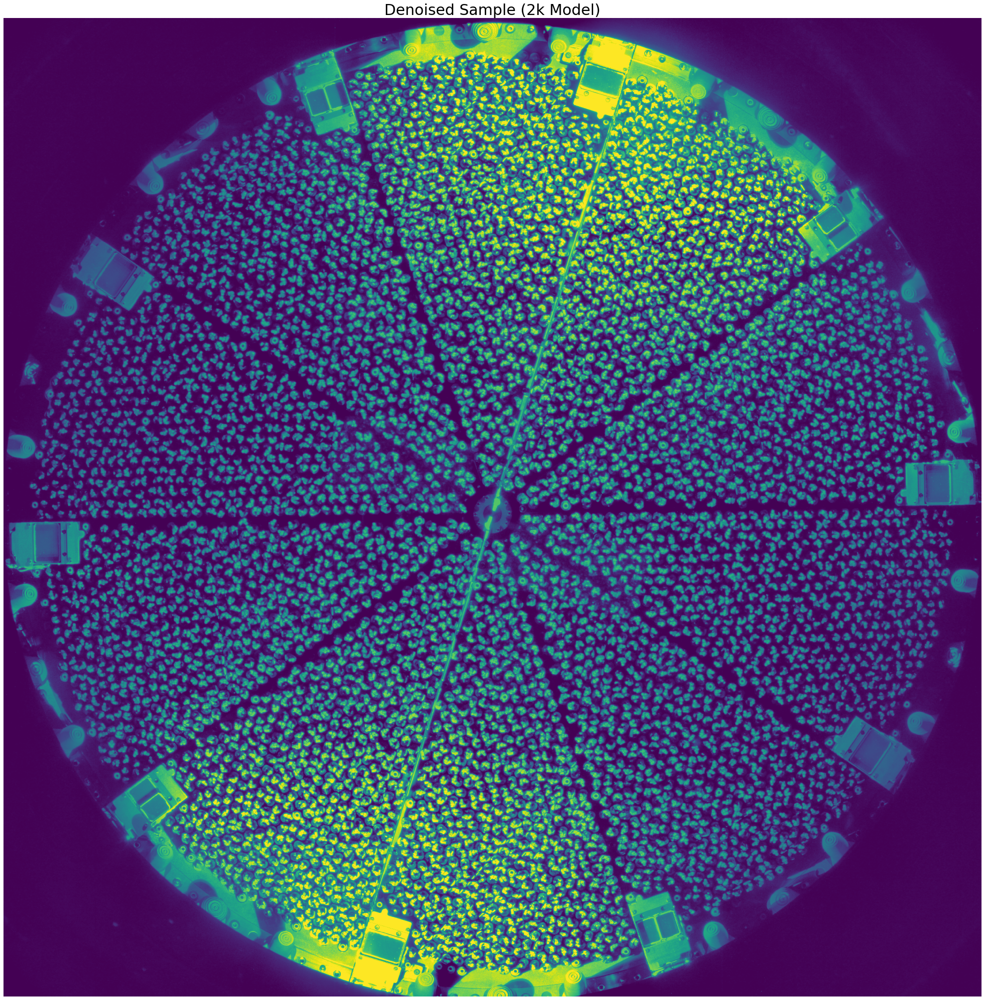

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(40,36))
vmin, vmax = np.percentile(data_6k[0][0][0], (1,99))

ax.imshow(full[0][0], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Denoised Sample (2k Model)', fontsize=30)

plt.imsave('Denoised_2k_model.png', full[0][0], vmin=vmin, vmax=vmax, origin='lower')

## Plots for David

Plots of the seam region between 2 2k by 2k slices. The first two is the left blue column from the image drawn in meeting 5 on 2-8-22 & the second 2 images are the horizontal red row

Text(0.5, 1.0, 'Horizontal seam in the center of image')

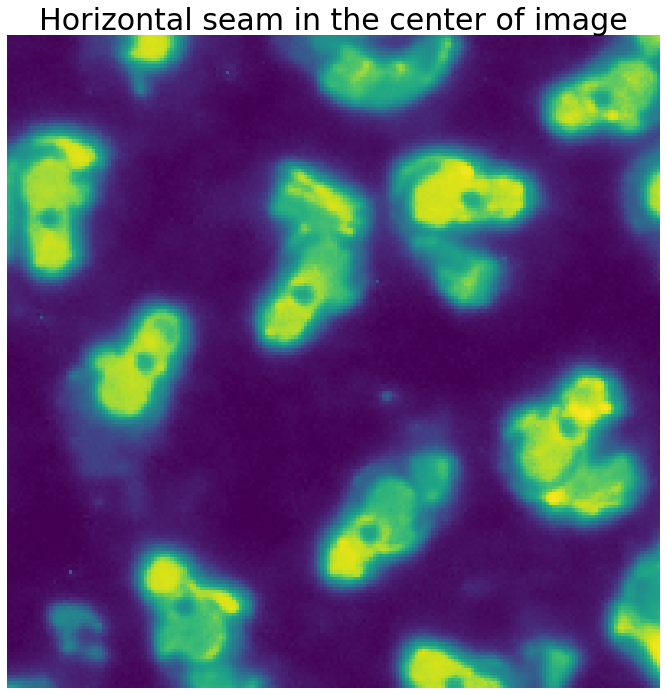

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(16,12))
vmin, vmax = np.percentile(data_6k[0][0][0][3900:4100,1000:1200], (1,99))

ax.imshow(full[0][0][3900:4100,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Horizontal seam in the center of image', fontsize=30)
# plt.imsave('Horizontal_seam1.png', full[0][0][3900:4100,1000:1200], vmin=vmin, vmax=vmax, origin='lower')

Text(0.5, 1.0, 'Horizontal seam in the center of image')

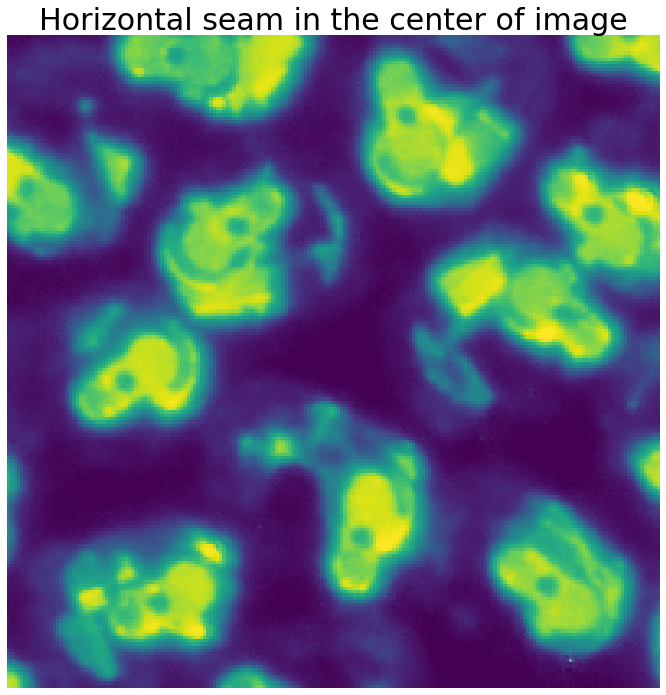

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(16,12))
vmin, vmax = np.percentile(data_6k[0][0][0][1900:2100,1000:1200], (1,99))

ax.imshow(full[0][0][1900:2100,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Horizontal seam in the center of image', fontsize=30)
# plt.imsave('Horizontal_seam2.png', full[0][0][1900:2100,1000:1200], vmin=vmin, vmax=vmax, origin='lower')

Text(0.5, 1.0, 'Horizontal & vertical seam should be in the center of image')

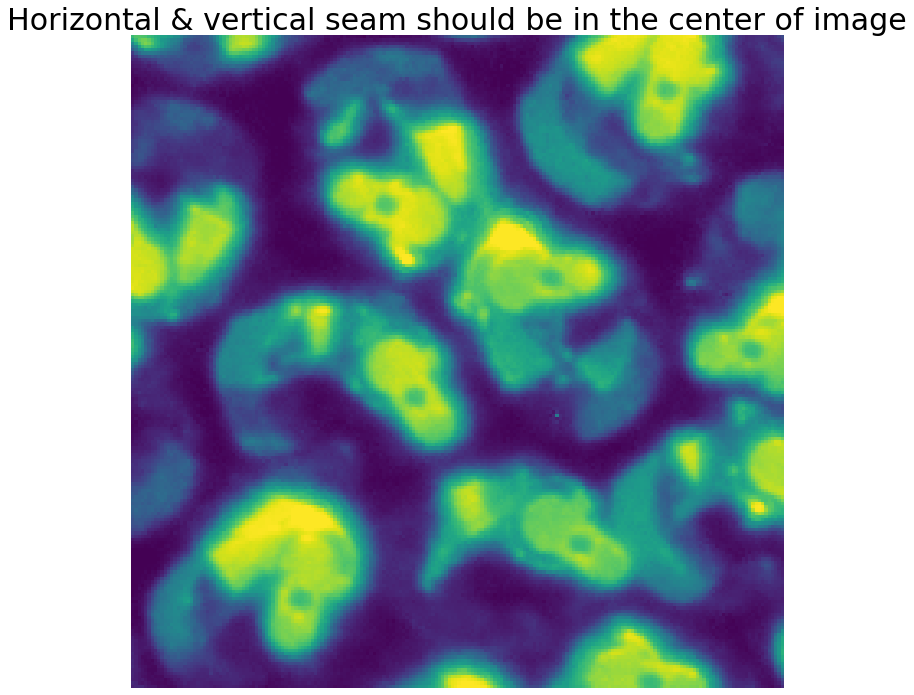

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(16,12))
vmin, vmax = np.percentile(data_6k[0][0][0][3900:4100,3900:4100], (1,99))

ax.imshow(full[0][0][3900:4100,3900:4100], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Horizontal & vertical seam should be in the center of image', fontsize=30)
# plt.imsave('Hor_vert_seam1.png', full[0][0][3900:4100,3900:4100], vmin=vmin, vmax=vmax, origin='lower')

Text(0.5, 1.0, 'Horizontal & vertical seam should be in the center of image')

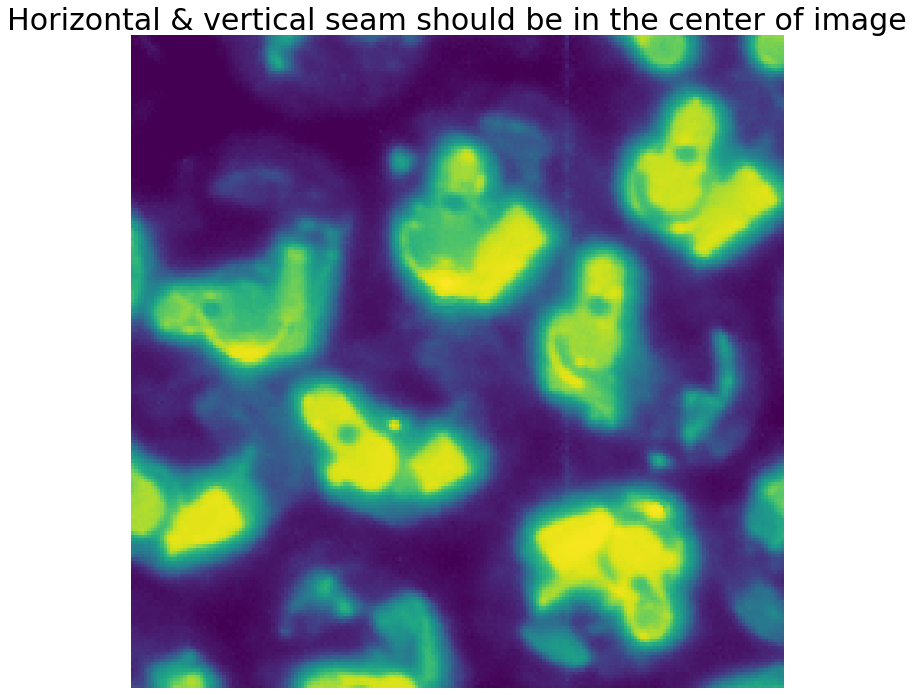

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(16,12))
vmin, vmax = np.percentile(data_6k[0][0][0][1900:2100,1900:2100], (1,99))

ax.imshow(full[0][0][1900:2100,1900:2100], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Horizontal & vertical seam should be in the center of image', fontsize=30)
# plt.imsave('Hor_vert_seam2.png', full[0][0][1900:2100,1900:2100], vmin=vmin, vmax=vmax, origin='lower')

Text(0.5, 1.0, 'Vertical seam should be in the center of image')

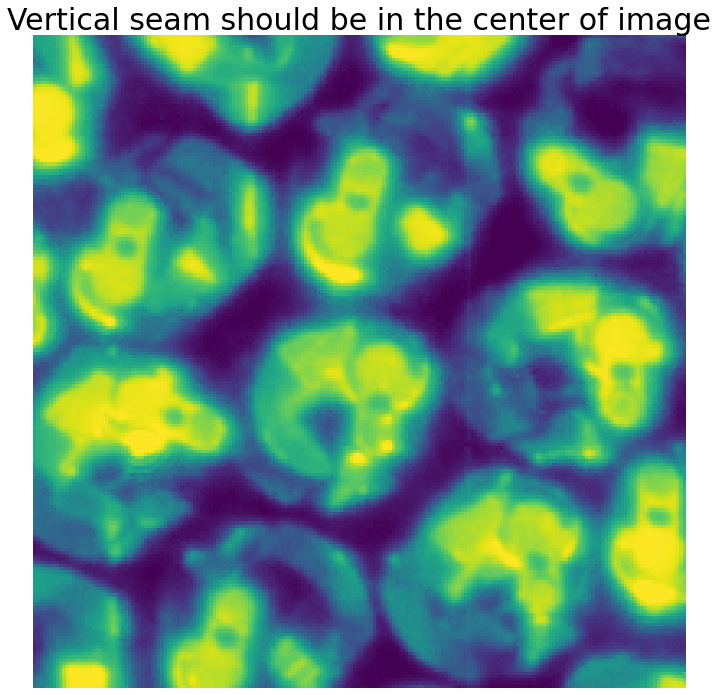

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(16,12))
vmin, vmax = np.percentile(data_6k[0][0][0][1000:1200,1900:2100], (1,99))

ax.imshow(full[0][0][1000:1200,1900:2100], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Vertical seam should be in the center of image', fontsize=30)
# plt.imsave('Vert_seam1.png', full[0][0][1900:2100,1900:2100], vmin=vmin, vmax=vmax, origin='lower')

Text(0.5, 1.0, 'Vertical seam should be in the center of image')

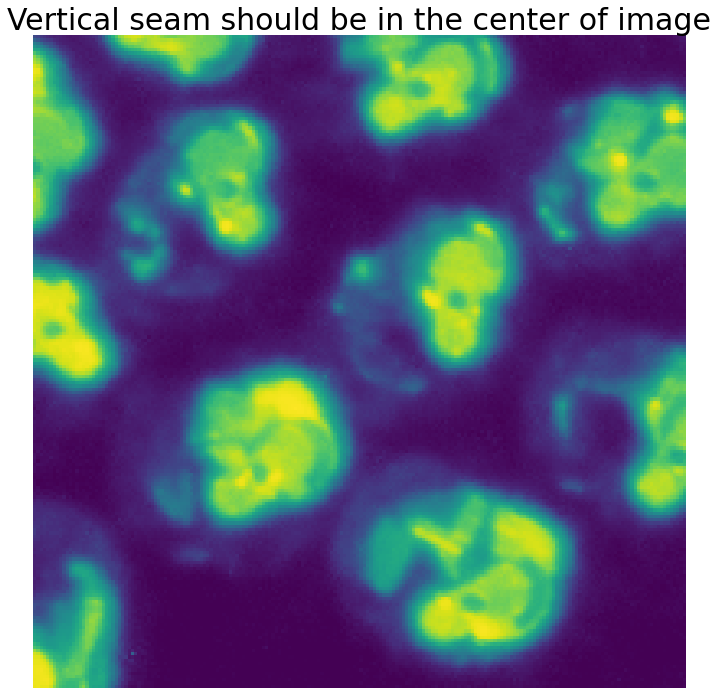

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(16,12))
vmin, vmax = np.percentile(data_6k[0][0][0][3000:3200,3900:4100], (1,99))

ax.imshow(full[0][0][3000:3200,3900:4100], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax.axis('off')
ax.set_title('Vertical seam should be in the center of image', fontsize=30)
# plt.imsave('Vert_seam2.png', full[0][0][1900:2100,1900:2100], vmin=vmin, vmax=vmax, origin='lower')

# Back to testing functions to get the horizontal & vertical passes working

Text(0.5, 1.0, 'Truth Sample')

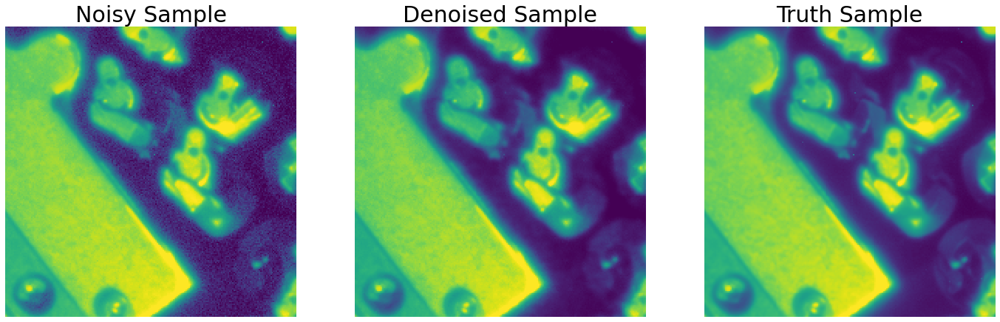

In [14]:
fig, ax = plt.subplots(1, 3, figsize=(24,20))
vmin, vmax = np.percentile(data_6k[0][0][0][1200:1400,1000:1200], (1,99))


ax[0].imshow(data_6k[0][0][0][1200:1400,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[0].axis('off')
ax[0].set_title('Noisy Sample', fontsize=30)
ax[1].imshow(full[0][0][1200:1400,1000:1200],vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[1].axis('off')
ax[1].set_title('Denoised Sample', fontsize=30)
ax[2].imshow(data_6k[1][0][0][1200:1400,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[2].axis('off')
ax[2].set_title('Truth Sample', fontsize=30)

Text(0.5, 1.0, 'Truth Sample')

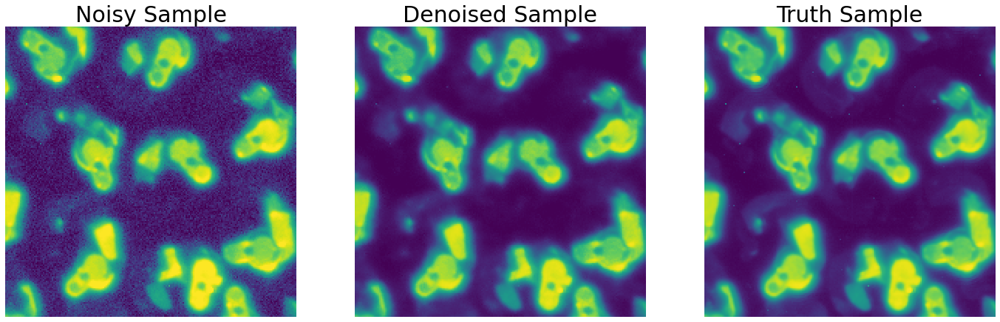

In [15]:
fig, ax = plt.subplots(1, 3, figsize=(24,20))
vmin, vmax = np.percentile(data_6k[0][0][0][2200:2400,1000:1200], (1,99))


ax[0].imshow(data_6k[0][0][0][2200:2400,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[0].axis('off')
ax[0].set_title('Noisy Sample', fontsize=30)
ax[1].imshow(full[0][0][2200:2400,1000:1200],vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[1].axis('off')
ax[1].set_title('Denoised Sample', fontsize=30)
ax[2].imshow(data_6k[1][0][0][2200:2400,1000:1200], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[2].axis('off')
ax[2].set_title('Truth Sample', fontsize=30)

Text(0.5, 1.0, 'Denoised Sample')

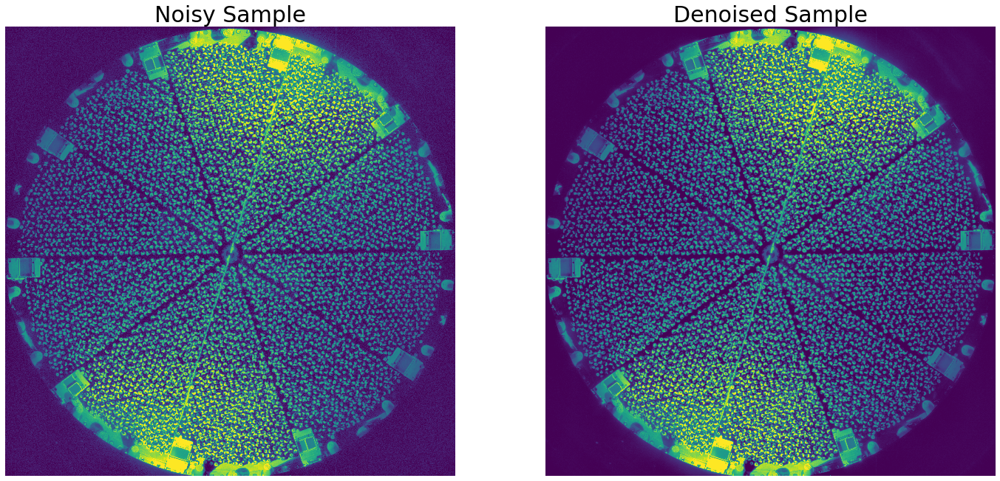

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(24,20))
vmin, vmax = np.percentile(data_6k[0][0][0], (1,99))

ax[0].imshow(data_6k[0][0][0], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[0].axis('off')
ax[0].set_title('Noisy Sample', fontsize=30)
ax[1].imshow(full[0][0], vmin=vmin, vmax=vmax, origin='lower', interpolation='none')
ax[1].axis('off')
ax[1].set_title('Denoised Sample', fontsize=30)

In [17]:
# slice_list = [2000, 4000, 6000]
    
# for i in range(len(slice_list)):
#     full1, count1 = full_grid_pass_window(dataset=data_6k,
#                                      model= DnCNN,
#                                      samp_idx=0,
#                                      w_start=0,
#                                      w_end=slice_list[i],
#                                      h_start=0,
#                                      h_end=2000)

In [18]:
# slice_list = [2000, 4000, 6000]

# for j in range(len(slice_list)):
#     full2, count2 = full_grid_pass_window(dataset=data_6k,
#                                      model= DnCNN,
#                                      samp_idx=0,
#                                      w_start=0,
#                                      w_end=slice_list[i],
#                                      h_start=0,
#                                      h_end=4000)

I'm curious why this is out of memory? Trying to allocate the same amount of memory as the double for loop. Seems like I'm not shutting off or deleting the data & it's being stored in successive calls?

In [19]:
# slice_list = [2000, 4000, 6000]
 
# for k in range(len(slice_list)):
#     full3, count3 = full_grid_pass_window(dataset=data_6k,
#                                      model=DnCNN,
#                                      samp_idx=0,
#                                      w_start=0,
#                                      w_end=slice_list[k],
#                                      h_start=0,
#                                      h_end=6000)

In [20]:
# full = full1 + full2 + full3

In [21]:
# plt.imshow(full[0][0])

When I do eveything manually and separately and then add everything together at the end it works. But this isn't clean. Need to figure out a way of not doing for loops potentionally.

In [22]:
# slice_list = [2000, 4000, 6000]



# full1, count1 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=0,
#                              w_end=2000,
#                              h_start=0,
#                              h_end=2000)

# full2, count2 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=2000,
#                              w_end=4000,
#                              h_start=0,
#                              h_end=2000)

# full3, count3 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=4000,
#                              w_end=6000,
#                              h_start=0,
#                              h_end=2000)

# full4, count4 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=0,
#                              w_end=2000,
#                              h_start=2000,
#                              h_end=4000)

# full5, count5 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=2000,
#                              w_end=4000,
#                              h_start=2000,
#                              h_end=4000)

# full6, count6 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=4000,
#                              w_end=6000,
#                              h_start=2000,
#                              h_end=4000)

# full7, count7 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=0,
#                              w_end=2000,
#                              h_start=4000,
#                              h_end=6000)

# full8, count8 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=2000,
#                              w_end=4000,
#                              h_start=4000,
#                              h_end=6000)

# full9, count9 = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=4000,
#                              w_end=6000,
#                              h_start=4000,
#                              h_end=6000)

In [23]:
# full = full1 + full2 + full3 + full4 + full5 + full6 + full7 + full8 + full9

In [24]:
# plt.imshow(full[0][0])

In [25]:
# fig, ax = plt.subplots(1, 2, figsize=(24,20))
# ax[0].imshow(data_6k[0][0][0][1000:1200,1000:1200], origin='lower', interpolation='none')
# ax[0].axis('off')
# ax[0].set_title('Noisy Sample')
# ax[1].imshow(full[0][0][1000:1200,1000:1200], origin='lower', interpolation='none')
# ax[1].axis('off')
# ax[1].set_title('Clean Sample')

In [26]:
# plt.imshow(full[0][0][1000:1200,1000:1200])

In [27]:
# plt.imshow(data_6k[0][0][0][1000:1200,1000:1200])

In [28]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=2000,
#                              w_end=4000,
#                              h_start=0,
#                              h_end=2000)

In [29]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=4000,
#                              w_end=6000,
#                              h_start=0,
#                              h_end=2000)

In [30]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=0,
#                              w_end=2000,
#                              h_start=2000,
#                              h_end=4000)

In [31]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=2000,
#                              w_end=4000,
#                              h_start=2000,
#                              h_end=4000)

In [32]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=4000,
#                              w_end=6000,
#                              h_start=2000,
#                              h_end=4000)

In [33]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=0,
#                              w_end=2000,
#                              h_start=4000,
#                              h_end=6000)

In [34]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=2000,
#                              w_end=4000,
#                              h_start=4000,
#                              h_end=6000)

In [35]:
# full, count = full_grid_pass_window(dataset=data_6k,
#                              model= DnCNN,
#                              samp_idx=0,
#                              w_start=4000,
#                              w_end=6000,
#                              h_start=4000,
#                              h_end=6000)

In [36]:
# plt.imshow(full[0][0])

In [37]:
# def full_grid_pass(dataset,
#                    model,
#                    w_start_idx,
#                    w_end_idx,
#                    h_start_idx,
#                    h_end_idx):
    
#     """
#     Conducts denoising in 2000x2000 sub-image slices of the whole 
#     6000x6000 focal plane image. It implements the first of three
#     passes of the image. It implements 9 inferences over the whole
#     focal plane image and covers the entire image.
    
    
    
#     Parameters:
#     -----------
    
#     dataset: np.array
#         Should be a 5-D array of:
        
#         dataset.shape = (dataset, number of samples, channel number,
#                          number of pixels in width, number of pixels in height)
    
    
#     model: pytorch model
#         Should be DnCNN or DnCNN-B as proposed as in Zheng et al. 2017
        
    
#     w_start_idx: int
#         Starting index of the width of the subimage window
        
#     w_end_idx: int
#         Ending index of the width of the subimage window
        
#     h_start_idx: int
#         Starting index of the height of the subimage window
        
#     h_end_idx: int
#         Ending index of the height of the subimage window  
        
#     Returns:
#     --------
    
#     full: np.array
#         A (6000, 6000) array that contains all 9 of the (2000x2000) 
#         sub-images combined together
        
        
#     count: np.array
#         An array that counts how many times an individual pixel has had
#         a denoising window applied to it. This will be used to average
#         over the pixels that are denoised multiple times.
#     """